# **Chapter 01 금융 데이터와 전처리**
**[mark down math functions](https://twinstarinfo.blogspot.com/2019/11/bloggerblogspot-markdown-mathjax.html)** \\  **[Finance-data](https://github.com/FinanceData/FinanceDataReader)**

- ! pip install finance-datareader
- ! pip install beautifulsoup4

## **1 주식 수익률 공식**

$R_t (단순 수익률) = {(P_t - P_{t-1}) \over P_{t-1}} = {P_t \over P_{t-1}} -1 $

$r_t (로그 수익률) = {log({P_t \over P_{t-1}})} = log({P_t}) - log({P_{t-1}})$

In [1]:
import os
import pandas as pd
file_name = './data/stock-samsung.csv'

if os.path.isfile(file_name): # Checking the File exist
    data_stock = pd.read_csv(file_name)
    data_stock['Date'] = pd.to_datetime(data_stock['Date']) # datetime 포맷 변경
    data_stock = data_stock.set_index('Date')               # 변경된 컬럼을 Index 로 설정

else:  # if not, download the data
    from FinanceDataReader import DataReader as fdr
    data_stock = fdr('005930', '1999-01-01').reset_index()
    data_stock.to_csv(file_name, index=None)
data_stock.head(3)

,Open,High,Low,Close,Volume,Change
Date,,,,,,
1999-01-04,1776,1776,1624,1693,666160,0.095084
1999-01-05,1692,1712,1649,1673,643209,-0.011813
1999-01-06,1702,1720,1651,1718,645110,0.026898


In [2]:
import numpy as np
# df = data_stock.loc[:, 'Close']  # Series 로 데이터 추출
df = data_stock.loc[:, ['Close']]  # DataFrame 으로 데이터 추출
df.rename(columns={'Close':'adj_close'}, inplace=True)

# 추가 수익률 계산내용의 추가
df['simple_rtn'] = df.adj_close.pct_change()                  # 단순 수익률 계산 (자산기준 수익률 가중화 합산)
df['log_rtn'] = np.log(df.adj_close / df.adj_close.shift(1))  # Log 수익률 계산 (시간에 따른 수익률 log 합산)
df.head(3)

,adj_close,simple_rtn,log_rtn
Date,,,
1999-01-04,1693,NaN,NaN
1999-01-05,1673,-0.011813,-0.011884
1999-01-06,1718,0.026898,0.026542


In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import warnings
import matplotlib.pyplot as plt
plt.style.use('seaborn')
# plt.style.use('seaborn-colorblind') #alternative
# plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['figure.dpi'] = 300
plt.rc('axes', unicode_minus=False)
warnings.simplefilter(action='ignore', category=FutureWarning)

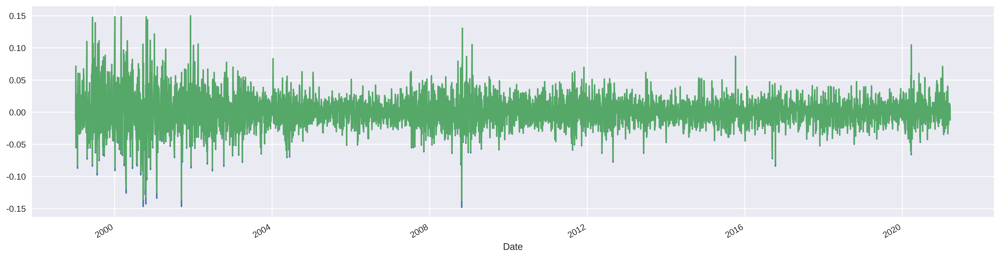

In [4]:
plt.rcParams['figure.figsize'] = (20.0, 5.0)
df.log_rtn.plot()
df.simple_rtn.plot()
plt.show()

## **2 금융 추가정보 확보하기**
- 월간 소비자 물가지수를 활용하여 지수변동률 변환하기
- 인플레이션을 고려한 가격 적용하기

$R^r_t = {{1+R_t (단순 수익률)  } \over {1+ \pi_t (인플레이션율) }} - 1 $

### **1) Join the Tables**

In [5]:
# 기준 테이블을 생성한 뒤, 다른 데이터의 값을 덧붙이는 예시
df_all_dates = data_stock.loc['1999-12-31':'2010-12-31',:]
df_all_dates.join(df[['adj_close']], how='left').fillna(method="ffill").asfreq('M').tail()

,Open,High,Low,Close,Volume,Change,adj_close
Date,,,,,,,
2010-07-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-08-31,15320.0,15439.0,15119.0,15120.0,441643.0,-0.025773,15120.0
2010-09-30,15440.0,15580.0,15340.0,15540.0,337258.0,0.006477,15540.0
2010-10-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-11-30,16640.0,16920.0,16520.0,16520.0,424616.0,-0.011962,16520.0


### **2) BOK EOS 한국은행 통계정보 API**
- **[한국은행 API Key 확인하기](https://ecos.bok.or.kr/jsp/openapi/OpenApiController.jsp?t=myAuthKey#)**
- **[한국은행 통계코드 검색](https://ecos.bok.or.kr/jsp/openapi/OpenApiController.jsp?t=guideStatCd&menuGroup=MENU000004&menuCode=MENU000024)**
- **[Python Tutorial](https://ecos.bok.or.kr/jsp/openapi/OpenApiController.jsp?t=guideDevGuide&menuGroup=MENU000004&menuCode=MENU000017)**
- **[Python Example](https://hayjo.tistory.com/57)** // **[파이썬 자료수집 예시](https://bjecondata.blogspot.com/2019/08/open-api-ecos-ii.html)**

In [6]:
# https://bjecondata.blogspot.com/2019/08/open-api-ecos-ii.html
import pandas as pd
code_table= pd.read_csv('./data/BOK_ECOS_EXAMPLE.csv')
code_table.head(3)

,통계명,항목명1,통계코드,항목코드1,항목코드2,항목명2,항목코드3,항목명3,단위,URL
0,1.1.주요 통화금융지표,예금은행요구불예금회전율,010Y002,AAAA5,NaN,NaN,NaN,NaN,회/월,http://ecos.bok.or.kr/api/StatisticSearch/APIC...
1,1.1.주요 통화금융지표,화폐발행잔액(말잔),010Y002,AAAA11,NaN,NaN,NaN,NaN,십억원,http://ecos.bok.or.kr/api/StatisticSearch/APIC...
2,1.1.주요 통화금융지표,화폐발행잔액(평잔),010Y002,AAAA12,NaN,NaN,NaN,NaN,십억원,http://ecos.bok.or.kr/api/StatisticSearch/APIC...


In [7]:
# 필요한 자료코드 추출하기
search_text = '인플레'
code_index = [no   for no, _ in enumerate(code_table['통계명'].to_list())
              if _.find(search_text) != -1]
code_example = code_table.iloc[code_index, :].reset_index(drop=True)
code_example.head(3)
# code_example['URL'][:3].to_list()

,통계명,항목명1,통계코드,항목코드1,항목코드2,항목명2,항목코드3,항목명3,단위,URL
0,9.2.3 소비자동향조사(기대 인플레이션율)(전국),물가인식,040Y003,FMA,NaN,NaN,NaN,NaN,NaN,http://ecos.bok.or.kr/api/StatisticSearch/APIC...
1,9.2.3 소비자동향조사(기대 인플레이션율)(전국),<0%,040Y003,FMAAA,NaN,NaN,NaN,NaN,NaN,http://ecos.bok.or.kr/api/StatisticSearch/APIC...
2,9.2.3 소비자동향조사(기대 인플레이션율)(전국),0~1%,040Y003,FMAAB,NaN,NaN,NaN,NaN,NaN,http://ecos.bok.or.kr/api/StatisticSearch/APIC...


,cpi
Date,
2002-02-01,4.4
2002-03-01,4.3
2002-04-01,4.3


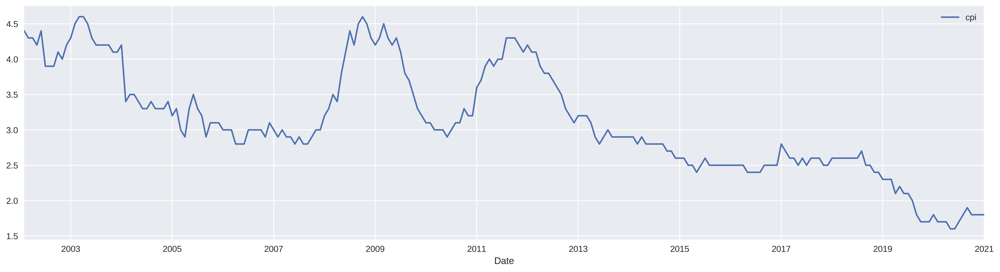

In [8]:
from data.finance import bok_eos_api
eos_table = bok_eos_api('040Y003', date_end='20210101', code2='FMB')  # 7년 단위로만 추출가능
eos_table['DATA_VALUE'] = list(map(lambda x : float(x),  eos_table['DATA_VALUE']))
eos_table = eos_table.rename(columns={'DATA_VALUE':'cpi', 'TIME':'Date'})

eos_table['Date'] = pd.to_datetime(eos_table['Date'], format='%Y%m')
eos_table = eos_table.set_index('Date')  # eos_table.head(3)
eos_table = eos_table[['cpi']]

# ploting the DataSet
eos_table.plot()
eos_table.head(3)

### **3) 필요한 정보들을 추출하여 유효 테이블 생성하기**

In [9]:
# CPI 정보를 데이블에 추가하고, 손실된 값들은 제거한다
data_stock.join(eos_table, 
    how='left').fillna(method='ffill').dropna().head()

,Open,High,Low,Close,Volume,Change,cpi
Date,,,,,,,
2002-02-01,6200,6320,6090,6180,712813,0.028286,4.4
2002-02-04,6200,6330,6180,6240,476171,0.009709,4.4
2002-02-05,6200,6490,6140,6460,973561,0.035256,4.4
2002-02-06,6400,6480,6360,6380,636965,-0.012384,4.4
2002-02-07,6300,6460,6240,6300,739516,-0.012539,4.4


In [10]:
# 분석에 필요한 날짜값을 생성하고
# 이를 기준으로 데이터 필터링
df_all_dates = pd.DataFrame(index=pd.date_range(start='2002-11-30', end='2020-12-31'))
df_monthly = df_all_dates.join(data_stock[['Close']], how='left').fillna(method='ffill').asfreq('M')
df_cpi = df_all_dates.join(eos_table[['cpi']], how='left').fillna(method='ffill').asfreq('M')
df_merge = df_monthly.join(df_cpi, how='left')

# Percent Change 내용 추가하기
df_merge['simple_rtn'] = df_merge.Close.pct_change()
df_merge['inflation_rate'] = df_merge.cpi.pct_change()

# 인플레이션에 따른 수익률 조정된 값을 Table 로 추가하기
df_merge['real_rtn'] = (df_merge.simple_rtn + 1) / (df_merge.inflation_rate + 1) - 1
df_merge.head()

,Close,cpi,simple_rtn,inflation_rate,real_rtn
2002-11-30,NaN,NaN,NaN,NaN,NaN
2002-12-31,6280.0,4.2,NaN,NaN,NaN
2003-01-31,5830.0,4.3,-0.071656,0.023810,-0.093245
2003-02-28,5590.0,4.5,-0.041166,0.046512,-0.083781
2003-03-31,5680.0,4.6,0.016100,0.022222,-0.005989


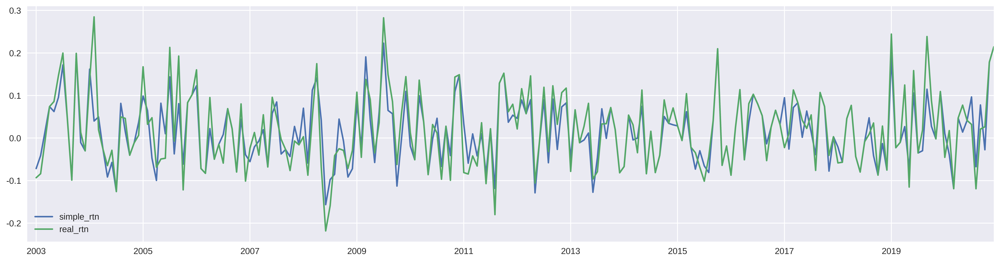

In [11]:
df_merge.simple_rtn.plot()
df_merge.real_rtn.plot()
plt.legend()

## **3 데이터 빈도 변경하기**
Frequency 변경하기
- 일별 수익률을 활용하여 -> 월간 실현 변동률 (realized volatility) -> 연환산 실행 (annualized)

$ RV = \sqrt{ \sum_{i=1}^T r_t^2 } $

### **1) 누적 수익률을 활용하여 월간 변화율 계산하기**

In [12]:
import numpy as np

# 우러간 실현 변동률 계산하는 함수
def realized_volatility(x):
    return np.sqrt(np.sum(x**2))

df_rv = df.groupby(pd.Grouper(freq='M')).apply(realized_volatility)
df_rv.rename(columns={'log_rtn': 'rv'}, inplace=True)
df_rv.head(3)

,adj_close,simple_rtn,rv
Date,,,
1999-01-31,7785.308729,0.162930,0.163318
1999-02-28,6931.771419,0.110700,0.110177
1999-03-31,8268.400873,0.117199,0.115058


In [13]:
# log 수익룰 값을 환산하는 함수
df_rv.rv = df_rv.rv ** np.sqrt(12)
df_rv.head()

,adj_close,simple_rtn,rv
Date,,,
1999-01-31,7785.308729,0.162930,0.001879
1999-02-28,6931.771419,0.110700,0.000481
1999-03-31,8268.400873,0.117199,0.000558
1999-04-30,8820.805065,0.166479,0.001924
1999-05-31,7871.735704,0.120777,0.000682


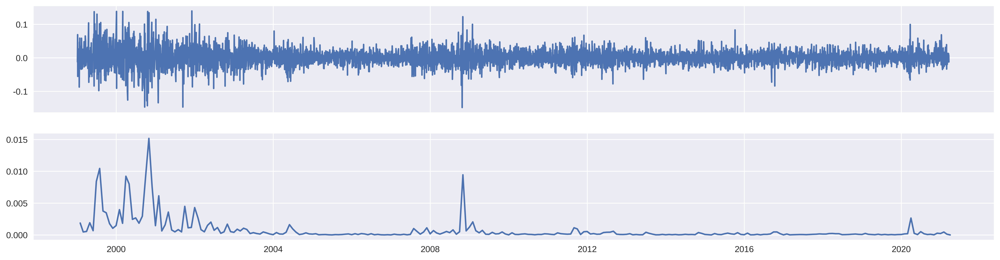

In [14]:
# Visualization
fig, ax = plt.subplots(2,1, sharex=True)
ax[0].plot(df.log_rtn)
ax[1].plot(df_rv.rv)
plt.show()

### **2) 월 평균 수익률의 계산**

<AxesSubplot:xlabel='Date'>

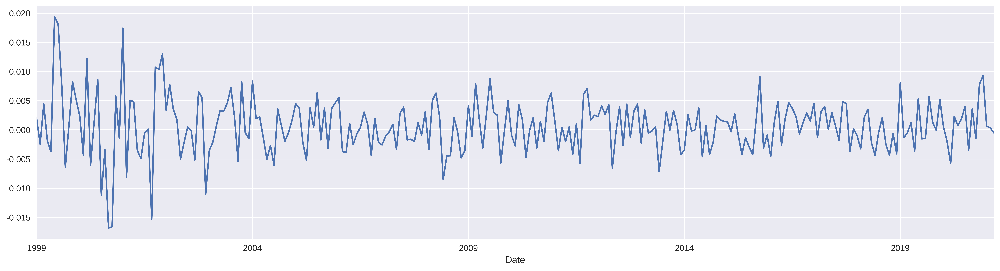

In [15]:
# from plotly.offline import init_notebook_mode
df.log_rtn.resample('M').mean().plot()

## **4 Visualization**
### **1) Matplotlib**
- **[한글 꺠지는 문제 해결하기](https://financedata.github.io/posts/matplotlib-hangul-for-ubuntu-linux.html)**
- **[D2Coding Font 설치하기](https://jamix.tistory.com/41)**

In [16]:
# 관련 한글폰트가 있는지 확인하기
# plt.rcParams["font.family"] = 'NanumGothicCoding'
# plt.rc('font', family='NanumGothic')
# plt.rc('font', family='D2Coding')

from matplotlib import font_manager
# sorted([_.name for _ in matplotlib.font_manager.fontManager.ttflist])

for _ in ['NanumGothic', 'NanumGothicCoding', 'D2Coding']:
    font_counts = [f for f in font_manager.fontManager.ttflist if _ in f.name]
    if len(font_counts) > 1:
        print(f"found : {_}")
        plt.rc('font', family=_) # Registered Hangul font
        break

found : NanumGothic


In [17]:
# plt.rcParams["font.family"] = 'NanumGothicCoding'
# plt.rc('font', family='NanumGothic')
fig, ax = plt.subplots(3, 1, figsize=(24,12), sharex=True)

df.adj_close.plot(ax=ax[0])  # 주가 Table
ax[0].set(title='SAMSUNG time series', ylabel='Stock Price (원)')

df.simple_rtn.plot(ax=ax[1]) # 단순 수익률 Table
ax[1].set(ylabel='Simple Return (원)')

df.log_rtn.plot(ax=ax[2])    # log 수익률 Table
ax[2].set(xlabel='Date', ylabel='Log Return (%)')
plt.show()

### **2) Cuffinks**
DataFrame 을 활용하여 Plotly 시각화 활용하는 모듈
- https://pypi.org/project/cufflinks/
- pip install chart_studio
- [Jupyter Lab 에서 plotly 실행하는 방법](https://plotly.com/python/getting-started/#jupyterlab-support)

```r
! pip install jupyterlab "ipywidgets>=7.5"
! jupyter labextension install jupyterlab-plotly@4.14.3
```

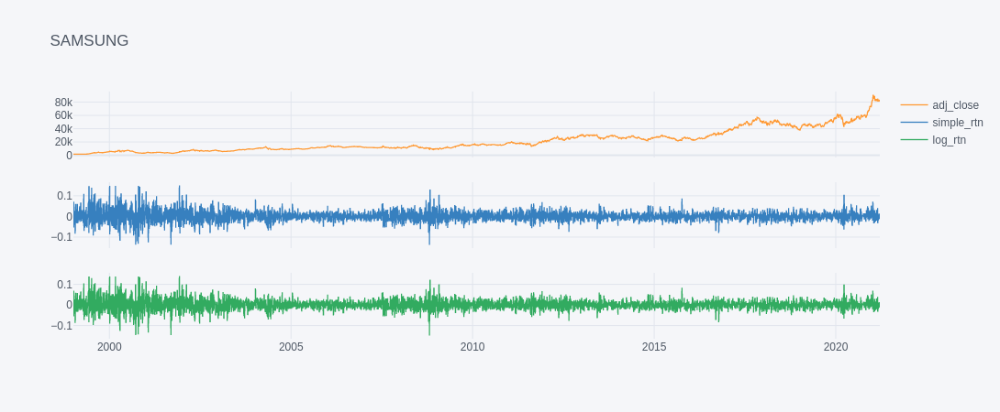

In [18]:
import cufflinks as cf
from plotly.offline import iplot, init_notebook_mode

cf.set_config_file(world_readable=True, theme='pearl', offline=True) # set up settings (run it once)
init_notebook_mode(connected=True)  # initialize notebook display

# Plotly from DataFrame
df.iplot(subplots=True, shape=(3,1), shared_xaxes=True, title="SAMSUNG")

## **5 특이값 (outier) 식별**
모델을 만들기 전에 특이값을 처리 합니다

In [19]:
# 이동평균선의 평균과 표준편차를 계산한다
df_rolling = df[['simple_rtn']].rolling(window=21).agg(['mean', 'std'])
df_rolling.columns = df_rolling.columns.droplevel()
df_outliers = df.join(df_rolling)

# 특이값을 추출하는 함수
def indenify_outlisers(row, n_sigmas=3):
    x = row['simple_rtn']
    mu = row['mean']
    sigma = row['std']
    if (x> mu+3 * sigma) | (x < mu -3 * sigma): return 1
    else: return 0

# 특이값 추출함수를 테이블에 Apply 하기
df_outliers['outlier'] = df_outliers.apply(indenify_outlisers, axis=1)
outlier = df_outliers.loc[df_outliers['outlier']==1, ['simple_rtn']] # 1 표시된 값 추출하기

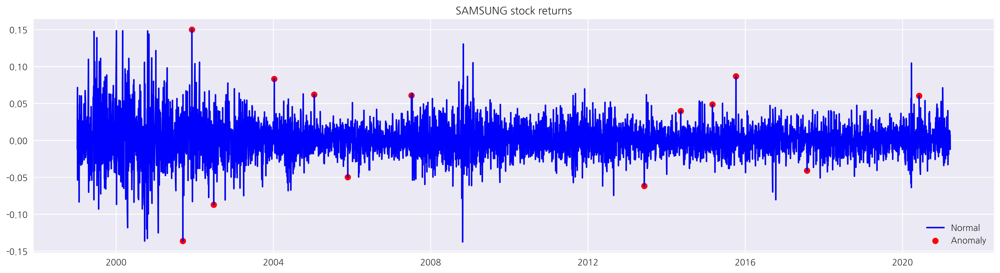

In [20]:
fix, ax = plt.subplots()
ax.plot(df_outliers.index, df_outliers.simple_rtn, color='blue', label='Normal')
ax.scatter(outlier.index, outlier.simple_rtn, color='red', label='Anomaly')
ax.set_title('SAMSUNG stock returns')
ax.legend(loc='lower right')